# Import Libraries

In [ ]:

!pip install music21 
!apt-get install -y lilypond
!pip install keras-tuner
!pip install midi2audio
!pip install librosa --upgrade

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline
from sklearn.model_selection import train_test_split

import music21
from music21 import *

import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adamax

import os
import sys
import warnings
warnings.filterwarnings("ignore")
warnings.simplefilter("ignore")
np.random.seed(42)

import json
import random
import IPython
from IPython.display import Image, Audio
from collections import Counter


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  dvisvgm fonts-droid-fallback fonts-lmodern fonts-noto-mono fonts-urw-base35
  ghostscript libauthen-sasl-perl libdata-dump-perl libencode-locale-perl
  libfile-listing-perl libfont-afm-perl libfontenc1 libgs9 libgs9-common
  libharfbuzz-icu0 libhtml-form-perl libhtml-format-perl libhtml-parser-perl
  libhtml-tagset-perl libhtml-tree-perl libhttp-cookies-perl
  libhttp-daemon-perl libhttp-date-perl libhttp-message-perl
  libhttp-negotiate-perl libidn11 libijs-0.35 libio-html-perl
  libio-socket-ssl-perl libjbig2dec0 libkpathsea6 liblwp-mediatypes-perl
  liblwp-protocol-https-perl libmailtools-perl libnet-http-perl
  libnet-smtp-ssl-perl libnet-ssleay-perl libptexenc1 libpython2-stdlib
  libsynctex2 libteckit0 libtexlua53 libtexluajit2 libtex

# Load the MIDI Files

In [ ]:
#Loading the list of chopin's midi files as stream 
filepath = "/content/drive/MyDrive/Colab Notebooks/schumann-24/" # change it to your filepath
#Getting midi files
all_midis= []
c = 0
for i in os.listdir(filepath):
    if i.endswith(".mid"):
        tr = filepath+i
        print(i)
        midi = converter.parse(tr)
        all_midis.append(midi)

scn16_4.mid
scn16_2.mid
scn15_2.mid
scn15_4.mid
scn16_7.mid
scn15_13.mid
scn15_7.mid
scn16_5.mid
scn15_12.mid
scn68_12.mid
schum_abegg.mid
scn15_11.mid
scn15_1.mid
scn68_10.mid
scn15_5.mid
scn15_6.mid
scn16_1.mid
scn15_8.mid
scn16_8.mid
scn15_10.mid
scn15_9.mid
scn16_3.mid
scn15_3.mid
scn16_6.mid


# Useful Functions.

In [ ]:
# function to extract notes from midi file
def extract_notes(file):
    notes = []
    pick = None
    for i in file:
        songs = instrument.partitionByInstrument(i)
        for part in songs.parts:
            pick = part.recurse()
            for element in pick:
                if isinstance(element, note.Note):
                    notes.append(str(element.pitch))
                elif isinstance(element, chord.Chord):
                    notes.append(".".join(str(n) for n in element.normalOrder))
                    
                    
    return notes

# get the list of notes as a corpus
corpus = extract_notes(all_midis)
print("Total notes in all the Mozart MIDIs in the dataset:", len(corpus))

Total notes in all the Mozart MIDIs in the dataset: 20588


In [ ]:
print("First fifty values in the Corpus:", corpus[:50])

First fifty values in the Corpus: ['3.9', '0.5', '10.3', '5.10', 'D5', 'C5', '0.3', '5.9', '10.3', 'B-2', 'F3', '3.9', 'C3', 'F3', '7.10', 'E-4', 'B-2', 'F3', 'C4', 'F4', 'A2', '4.5.7', 'G4', '5.9', 'E-4', 'E-4', '2.8', '10', '8.0', 'E-3', '0', '3', 'D2', 'G3', '8.0', '2', 'F3', '5.8.10', '0', '8.10', 'E-3', '10', 'D3', '8', 'C3', '7', '6.7.8', 'B-2', '8', '9.10.0']


In [ ]:
# function to generate music after training model
def melody_generator(note_count):
    seed_index = np.random.randint(0, len(X_seed) - 1)
    seed = np.reshape(X_seed[seed_index], (1, length, 1))
    notes = []

    for _ in range(note_count):
        prediction = model.predict(seed, verbose=0)[0]
        prediction = prediction / np.sum(prediction)  # softmax simplification

        index = np.argmax(prediction)
        notes.append(index)

        seed = np.roll(seed, -1, axis=1)
        seed[0, -1, :] = index / float(symbol_len)

    music = [reverse_map[char] for char in notes]
    melody = chord_n_notes(music)
    midi = stream.Stream(melody)
    return music, midi

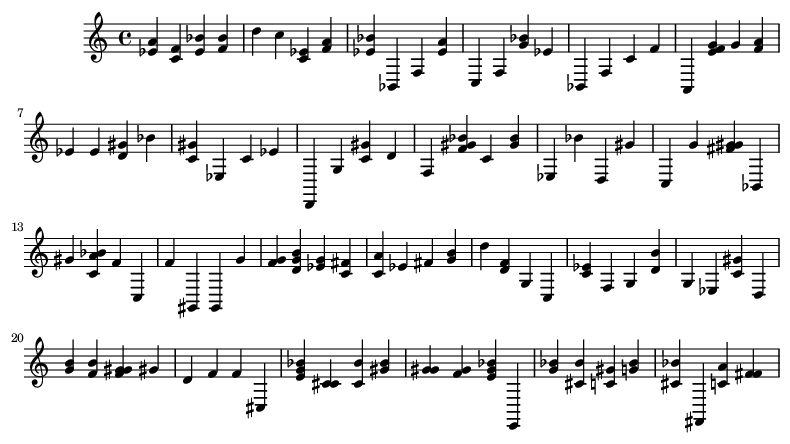

In [ ]:
# function to display music sheet
def show(music):
    display(Image(str(music.write("lily.png"))))
    
def chord_n_notes(snippet):
    melody = []
    offset = 0
    for i in snippet:
        # if it is a chord
        if "." in i or i.isdigit():
            # separate the notes in chords
            chord_notes = i.split(".")
            notes = [note.Note(int(n)) for n in chord_notes]
            chord_snip = chord.Chord(notes)
            chord_snip.offset = offset
            melody.append(chord_snip)
        # if it is a note
        else:
            note_snip = note.Note(i)
            note_snip.offset = offset
            melody.append(note_snip)
        # increase offset each iteration so that notes do not stack
        offset += 1

    melody_midi = stream.Stream(melody)
    return melody_midi

melody_snippet = chord_n_notes(corpus[:100])

show(melody_snippet)

# Create a Count Dictionary

In [ ]:
# create a count dictionary
count = Counter(corpus)
print("Total unique notes in the corpus:", len(count))

Total unique notes in the corpus: 247


In [ ]:
# explore the notes dictionary
notes = list(count.keys())
recurrence = list(count.values())

# function to find average recurrence for a note in corpus
def average(lst):
  return sum(lst)/len(lst)

print("Average recurrence of a note in corpus:", average(recurrence))
print("Most frequent note in corpus appeared:", max(recurrence), "times")
print("Least frequent note in corpus appeared:", min(recurrence), "time")

Average recurrence of a note in corpus: 83.35222672064778
Most frequent note in corpus appeared: 723 times
Least frequent note in corpus appeared: 1 time


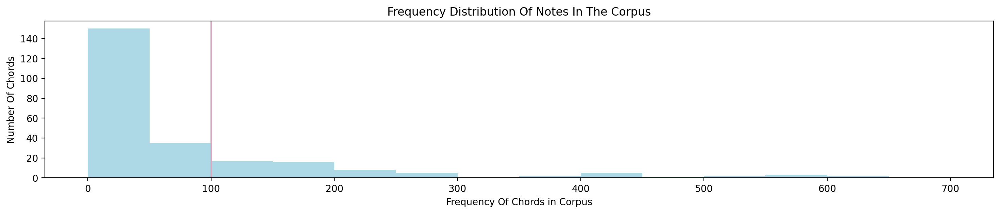

In [ ]:
# Plotting the distribution of Notes
plt.figure(figsize = (18, 3))
bins = np.arange(0,(max(recurrence)), 50) 
plt.hist(recurrence, bins = bins, color = "lightblue")
plt.axvline(x = 100, color = "#DBACC1")
plt.title("Frequency Distribution Of Notes In The Corpus")
plt.xlabel("Frequency Of Chords in Corpus")
plt.ylabel("Number Of Chords")
plt.show()

# Eliminate the Rare Notes

In [ ]:
# get a list of rare notes
rare_note = []
for i, (key, value) in enumerate(count.items()):
  if value < 100:
    m = key
    rare_note.append(m)

print("Total number of notes that occur less than 100 times:", len(rare_note))

Total number of notes that occur less than 100 times: 185


In [ ]:
# eliminate the rare notes
for element in corpus:
  if element in rare_note:
    corpus.remove(element)

print("Length of corpus after elimination of the rare notes:", len(corpus))

Length of corpus after elimination of the rare notes: 17218


# Save Corpus

In [ ]:
# save corpus
with open("corpus.txt", 'w') as f:
   json.dump(corpus, f)

# load corpus
# with open("data.txt", 'r') as f:
#   corpus = json.load(f)

# Map Dictionary

In [ ]:
# store all the unique characters in the corpus to a mapping dictionary
symbol = sorted(list(set(corpus)))

corpus_len = len(corpus)
symbol_len = len(symbol)

# build a dictionary to access the vocabulary from indices & vice versa
map = dict((c, i) for i, c in enumerate(symbol))
reverse_map = dict((i, c) for i, c in enumerate(symbol))

print("Total number of characters:", corpus_len)
print("Number of unique characters:", symbol_len)

Total number of characters: 17218
Number of unique characters: 199


In [ ]:

length = 40
features = []
targets = []

for i in range(0, corpus_len - length, 1):
  feature = corpus[i:i+length]
  target = corpus[i+length]
  features.append([map[j] for j in feature])
  targets.append(map[target])

datapoints_len = len(targets)
print("Total number of sequences in the corpus:", datapoints_len)

Total number of sequences in the corpus: 17178


# Reshape X & Normalize

In [ ]:
# reshape X & normalize
X = (np.reshape(features, (datapoints_len, length, 1))) / float(symbol_len)

# one hot encode the output variable
y = tf.keras.utils.to_categorical(targets)

In [ ]:
#Taking out a subset of data to be used as seed
X_train, X_seed, y_train, y_seed = train_test_split(X, y, test_size = 0.2, random_state = 42)


# Model's Hyperparameters

In [ ]:
# hyperparameters
from keras.regularizers import l2

rate = 0.1
learning_rate = 0.01
batch_size = 256
epochs = 200
optimizer = Adamax(learning_rate = learning_rate)
loss = 'categorical_crossentropy'
metrics = ['accuracy']
# Regularizer
reg = l2(0.01)

# Model Architecture
model = Sequential()
model.add(LSTM(512, input_shape = (X.shape[1], X.shape[2]), return_sequences = True))
model.add(Dropout(rate = rate))
model.add(LSTM(256))
model.add(Dense(256))
model.add(Dropout(rate = rate))
model.add(Dense(y.shape[1], activation = 'softmax'))

model.compile(optimizer = optimizer, loss = loss, metrics = metrics)
model.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 40, 512)           1052672   
                                                                 
 dropout_2 (Dropout)         (None, 40, 512)           0         
                                                                 
 lstm_3 (LSTM)               (None, 256)               787456    
                                                                 
 dense_2 (Dense)             (None, 256)               65792     
                                                                 
 dropout_3 (Dropout)         (None, 256)               0         
                                                                 
 dense_3 (Dense)             (None, 199)               51143     
                                                                 
Total params: 1,957,063
Trainable params: 1,957,063
No

In [ ]:
#Training the Model
history = model.fit(X_train, y_train, batch_size = batch_size, epochs = epochs) 


Epoch 1/200
54/54 [==============================] - 8s 44ms/step - loss: 4.5308 - accuracy: 0.0333
Epoch 2/200
54/54 [==============================] - 2s 44ms/step - loss: 4.2951 - accuracy: 0.0370
Epoch 3/200
54/54 [==============================] - 2s 44ms/step - loss: 4.2822 - accuracy: 0.0334
Epoch 4/200
54/54 [==============================] - 2s 44ms/step - loss: 4.2789 - accuracy: 0.0397
Epoch 5/200
54/54 [==============================] - 2s 44ms/step - loss: 4.2772 - accuracy: 0.0379
Epoch 6/200
54/54 [==============================] - 2s 44ms/step - loss: 4.2773 - accuracy: 0.0379
Epoch 7/200
54/54 [==============================] - 2s 44ms/step - loss: 4.2749 - accuracy: 0.0370
Epoch 8/200
54/54 [==============================] - 2s 44ms/step - loss: 4.2739 - accuracy: 0.0378
Epoch 9/200
54/54 [==============================] - 2s 45ms/step - loss: 4.2727 - accuracy: 0.0386
Epoch 10/200
54/54 [==============================] - 2s 45ms/step - loss: 4.2730 - accuracy: 0.0377

# Save the Model and Trainning History

In [ ]:
# save the model
model.save("/content/drive/MyDrive/Colab Notebooks/schumann-24/schumann-model.h5")

In [ ]:
import pickle
# save training history
with open('/content/drive/MyDrive/Colab Notebooks/schumann-24/history', 'wb') as file_pi:
    pickle.dump(history.history, file_pi)

In [ ]:
# load the model
# from tensorflow import keras
# model = keras.models.load_model('./mozart-model.h5')

In [ ]:
# # load training history
# with open('./history', "rb") as file_pi:
#     history = pickle.load(file_pi)

# # Note: to reload, just use history instead of history.history

# Plot the Learning Curve for Accuracy and Loss

[Text(0, 0.5, 'Training Loss')]

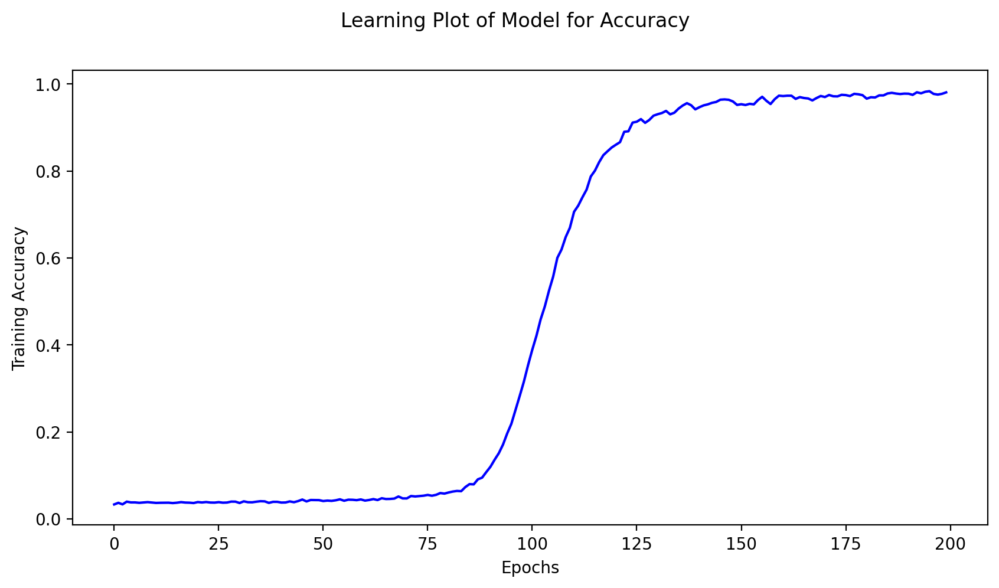

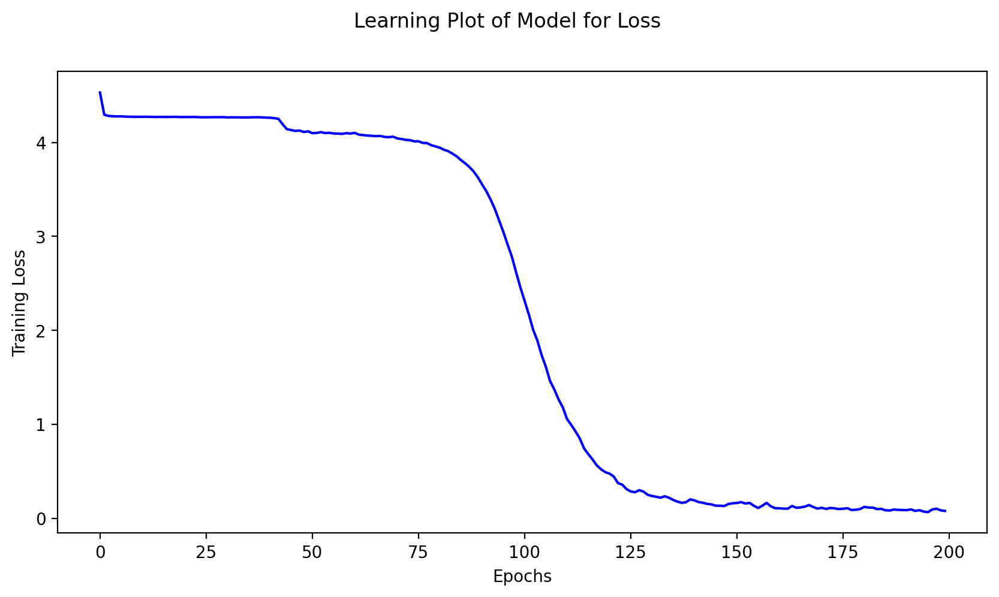

In [ ]:
# plot the learning curve for accuracy
history_df = pd.DataFrame(history.history)
fig = plt.figure(figsize = (10, 5))
fig.suptitle("Learning Plot of Model for Accuracy")
pa = sns.lineplot(data = history_df["accuracy"], color="blue")
pa.set(xlabel = "Epochs")
pa.set(ylabel = "Training Accuracy")

# plot the learning curve for loss
history_df = pd.DataFrame(history.history)
fig = plt.figure(figsize = (10, 5))
fig.suptitle("Learning Plot of Model for Loss")
pl = sns.lineplot(data = history_df["loss"], color="blue")
pl.set(xlabel = "Epochs")
pl.set(ylabel = "Training Loss")

# Generate Music

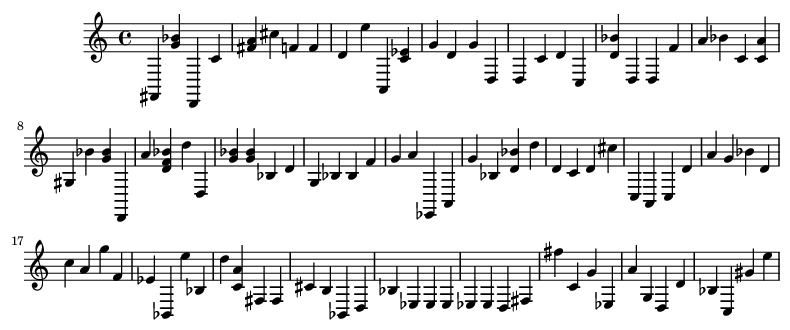

In [ ]:
music_notes, melody = melody_generator(100)
show(melody)

In [ ]:
# save the generated music
melody.write("midi", "/content/drive/MyDrive/Colab Notebooks/schumann-24/New_schumann.mid")

'/content/drive/MyDrive/Colab Notebooks/schumann-24/New_schumann.mid'

# Play Music

In [ ]:
# play generated music 
IPython.display.Audio("/content/drive/MyDrive/Colab Notebooks/schumann-24/New_schumann.wav")

# Creativity Assessment of the System

In [ ]:
from music21 import converter, instrument, note, chord

# Convert MIDI file to stream object
midi = converter.parse("/content/drive/MyDrive/Colab Notebooks/schumann-24/New_schumann.mid")

# Analyze the key
key = midi.analyze('key')
print("Key of the piece:", key)



Key of the piece: g minor


In [ ]:
# Get all the chords from the piece
chords = [element for element in midi.recurse() if isinstance(element, chord.Chord)]

# Analyze the chord progressions
for i in range(1, len(chords)):
    print(f'Progression: {chords[i-1].pitchedCommonName} -> {chords[i].pitchedCommonName}')


Progression: Minor Third above G -> Minor Third above F#
Progression: Minor Third above F# -> Minor Third above C
Progression: Minor Third above C -> Minor Sixth above D
Progression: Minor Sixth above D -> Major Sixth above C
Progression: Major Sixth above C -> Minor Third above G
Progression: Minor Third above G -> Bb-major triad
Progression: Bb-major triad -> Minor Third above G
Progression: Minor Third above G -> Minor Third above G
Progression: Minor Third above G -> Minor Sixth above D
Progression: Minor Sixth above D -> Major Sixth above C


In [ ]:
from music21 import interval

# Get all the notes from the piece
notes = [element for element in midi.recurse() if isinstance(element, note.Note)]

# Analyze the melodic intervals
for i in range(1, len(notes)):
    melodic_interval = interval.Interval(noteStart=notes[i-1], noteEnd=notes[i])
    print(f'Interval: {melodic_interval.niceName}')


Interval: Major Third
Interval: Minor Fourteenth
Interval: Augmented Octave
Interval: Augmented Fifth
Interval: Perfect Unison
Interval: Minor Third
Interval: Major Ninth
Interval: Perfect Nineteenth
Interval: Minor Fourteenth
Interval: Perfect Fourth
Interval: Perfect Fourth
Interval: Perfect Eleventh
Interval: Perfect Unison
Interval: Minor Seventh
Interval: Major Second
Interval: Major Ninth
Interval: Major Second
Interval: Perfect Unison
Interval: Minor Tenth
Interval: Major Third
Interval: Minor Second
Interval: Minor Seventh
Interval: Diminished Fourth
Interval: Diminished Tenth
Interval: Minor Twentieth
Interval: Perfect Nineteenth
Interval: Perfect Fourth
Interval: Perfect Double-octave
Interval: Minor Sixth
Interval: Major Third
Interval: Perfect Fifth
Interval: Minor Third
Interval: Perfect Unison
Interval: Perfect Fifth
Interval: Major Second
Interval: Major Second
Interval: Augmented Eighteenth
Interval: Augmented Fourth
Interval: Minor Fourteenth
Interval: Major Sixth
Inte

In [ ]:
# Convert MIDI file to stream object
midi = converter.parse("/content/drive/MyDrive/Colab Notebooks/schumann-24/New_schumann.mid")

# Get a list of all pitches
pitches = []
for element in midi.flat.notes:
    if isinstance(element, note.Note):
        pitches.append(element.pitch)
    elif isinstance(element, chord.Chord):
        pitches.extend(element.pitches)

# Get the highest and lowest pitches
highest_pitch = max(pitches, key=lambda pitch: pitch.frequency)
lowest_pitch = min(pitches, key=lambda pitch: pitch.frequency)

# Calculate the note range
note_range = highest_pitch.frequency - lowest_pitch.frequency

print(f"Note range: {note_range} Hz")


Note range: 710.5746799841472 Hz


# Music Theory Analysis

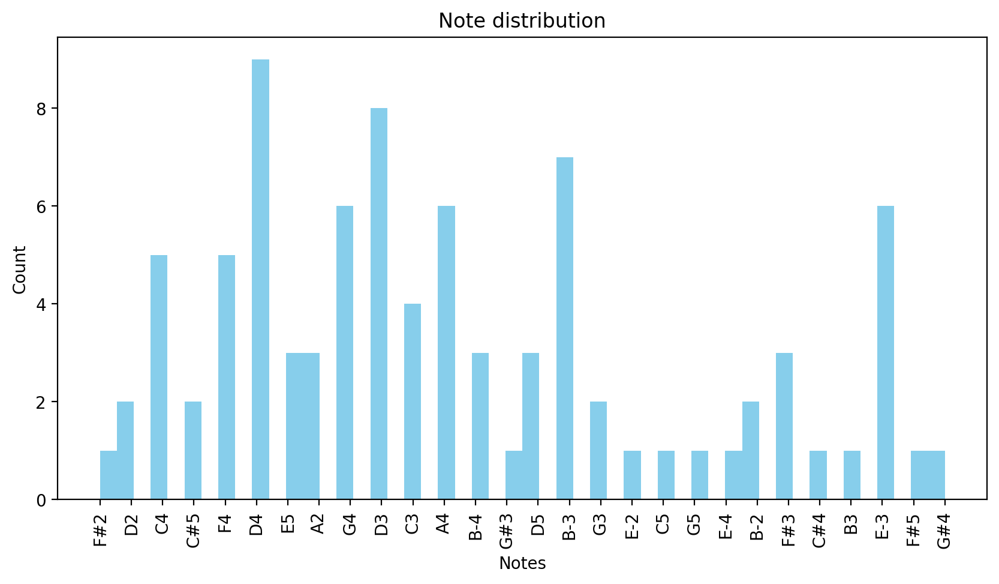

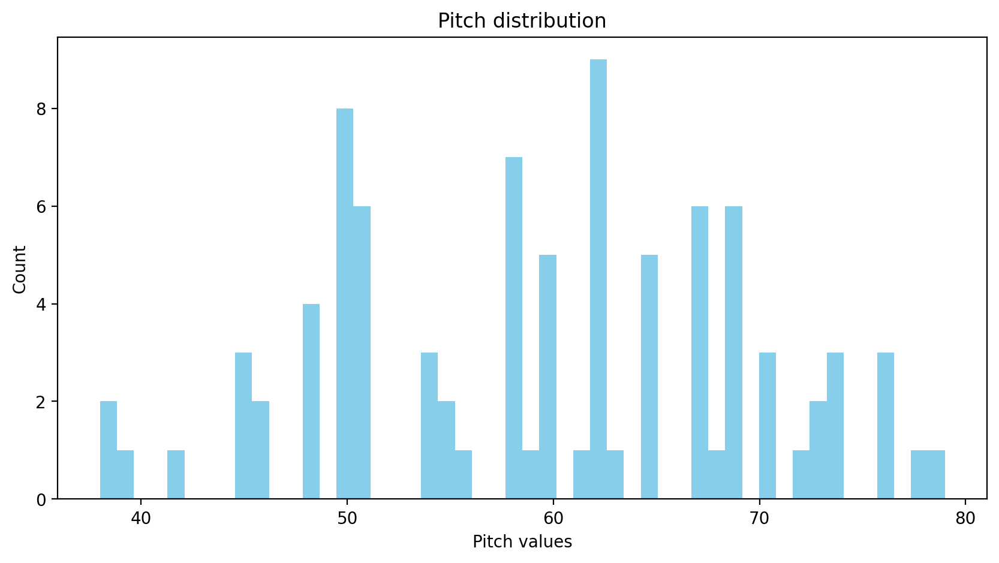

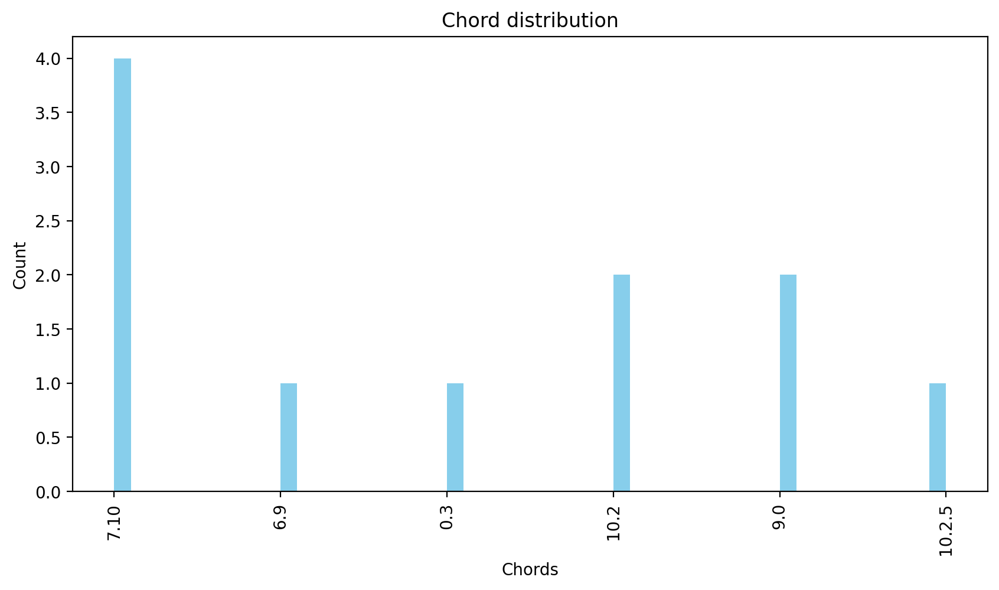

In [ ]:
from music21 import converter, instrument, note, chord
import matplotlib.pyplot as plt

midi = converter.parse("/content/drive/MyDrive/Colab Notebooks/schumann-24/New_schumann.mid")
notes = [element.nameWithOctave for element in midi.recurse() if isinstance(element, note.Note)]
chords = ['.'.join(str(n) for n in element.normalOrder) for element in midi.recurse() if isinstance(element, chord.Chord)]
pitch_values = [n.pitch.ps for n in midi.recurse() if isinstance(n, note.Note)]

# note distribution
plt.figure(figsize=(10, 5))
plt.hist(notes, bins=50, color="skyblue")
plt.xticks(rotation='vertical')
plt.title("Note distribution")
plt.xlabel("Notes")
plt.ylabel("Count")
plt.show()

# pitch distribution
plt.figure(figsize=(10, 5))
plt.hist(pitch_values, bins=50, color="skyblue")
plt.title("Pitch distribution")
plt.xlabel("Pitch values")
plt.ylabel("Count")
plt.show()

# chord distribution
plt.figure(figsize=(10, 5))
plt.hist(chords, bins=50, color="skyblue")
plt.xticks(rotation='vertical')
plt.title("Chord distribution")
plt.xlabel("Chords")
plt.ylabel("Count")
plt.show()


# Novelty in Terms of Unique Note Counts


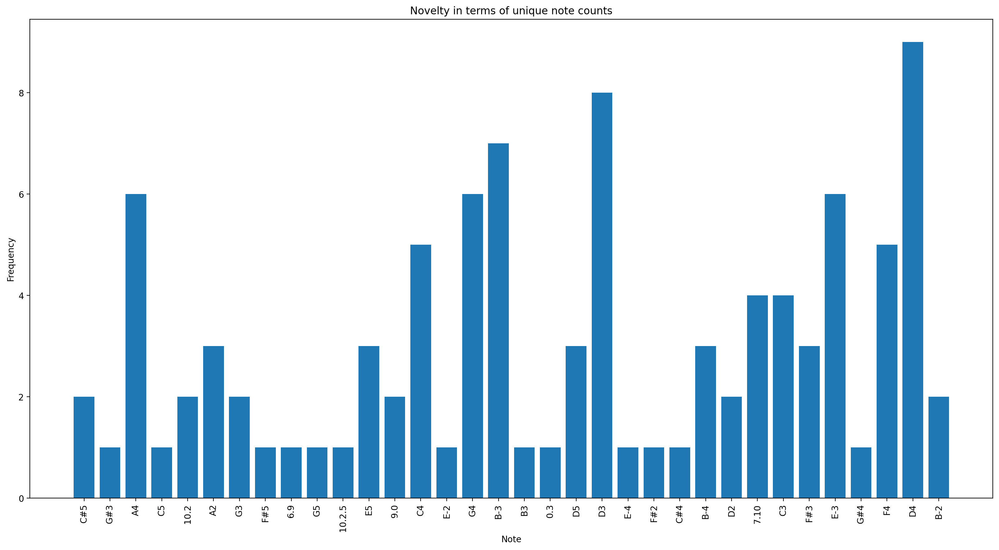

In [ ]:
from music21 import converter, note, chord
import matplotlib.pyplot as plt
import numpy as np

# Parse a MIDI file to a stream object
stream = converter.parse("/content/drive/MyDrive/Colab Notebooks/schumann-24/New_schumann.mid")

# Extract notes, chords, and rests from the stream
notes_to_parse = stream.flat.notes

notes = []
for element in notes_to_parse:
    if isinstance(element, note.Note):
        notes.append(str(element.pitch))
    elif isinstance(element, chord.Chord):
        notes.append('.'.join(str(n) for n in element.normalOrder))

unique_notes = list(set(notes))
note_counts = [notes.count(note) for note in unique_notes]

plt.figure(figsize=(20, 10))
plt.bar(unique_notes, note_counts)
plt.title('Novelty in terms of unique note counts')
plt.xlabel('Note')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.show()


# Compute Similarity

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer

from music21 import converter, note, chord

def midi_to_notes(filename):
    midi = converter.parse(filename)
    notes = []
    
    try:  # file has instrument parts
        parts = instrument.partitionByInstrument(midi)
        notes_to_parse = parts.parts[0].recurse() 
    except:  # file has notes in a flat structure
        notes_to_parse = midi.flat.notes

    for element in notes_to_parse:
        if isinstance(element, note.Note):
            notes.append(str(element.pitch))
        elif isinstance(element, chord.Chord):
            notes.append('.'.join(str(n) for n in element.normalOrder))
    
    return notes




def note_sequence_to_string(sequence):
    """Convert a sequence of note names to a string."""
    return ' '.join(sequence)

def compute_similarity(sequence1, sequence2):
    """Compute cosine similarity between two note sequences."""
    vectorizer = CountVectorizer().fit_transform([sequence1, sequence2])
    vectors = vectorizer.toarray()
    return cosine_similarity(vectors)[0, 1]

# Set the length of the window for comparing novelty
length = 50

# Convert the corpus to a sequence of strings
corpus_strings = [note_sequence_to_string(corpus[i:i+length]) for i in range(len(corpus)-length+1)]


# Convert the generated melody to a sequence of note names and then to a string
# Use the function to convert the MIDI file into a sequence of notes
music_notes = midi_to_notes("/content/drive/MyDrive/Colab Notebooks/schumann-24/New_schumann.mid")
generated_melody_string = note_sequence_to_string(music_notes)  

# Compute the similarity between the generated melody and each segment of the corpus
similarities = [compute_similarity(generated_melody_string, corpus_string) for corpus_string in corpus_strings]

# The novelty score could be 1 minus the maximum similarity
novelty_score = 1 - max(similarities)
print(max(similarities))
print('Novelty score:', novelty_score)


0.8986901622049769
Novelty score: 0.10130983779502312
